In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from scipy.linalg import solve
from collections import deque

In [3]:
class Edge:
    """
    params - k, rho параметры среды, в которой находится ячейка;
    position_data - x, y координата центра;
    values - массив из значений, где values[0] - p, values[1] - u, values[2] - v;
    """

    params = [0, 0]
    position_data = [0, 0]
    values = [0, 0, 0]

    def __init__ (self, position_data: list[float], values: list[float], params: list[float]):
        self.position_data = position_data
        self.values = values[:]
        self.params = params

    def get_values(self) -> list[float]:
        return self.values[:]
    
    def set_values(self, values: list[float]):
        self.values = values[:]

    def get_position(self) -> list[float]:
        return self.position_data
    
    def get_params(self) -> list[float]:
        return self.params
    

# Константы

In [4]:
N_x = 100 # Количество ячеек по оси x
N_y = 100 # Количество ячеек по оси y

hx = 1 / N_x
hy = 1 / N_y

rho = 1
k = 1

rho_data = [1, 2]
k_data = [1, 8]
# Параметры границы линейной (a, b): ax + b
#  0.403
border_line_params = [1, 0.173]
theta = np.arctan(border_line_params[0])

size_of_perturbation = 0.2 # сторона квадрата, в которое помещается возмущение
center_of_perturbation = 0.5

sigma = 0.8
# tau = sigma * hx * hy / (np.sqrt(k / rho) * (hx + hy))
tau = sigma * np.max((hx, hy)) / max(np.sqrt(np.array(k_data) / np.array(rho_data)))
# Умножение на 0.5 обусловлено тем, что за tau мы будем делать шаг сразу по х и y

phi = (np.arctan(N_x/N_y)) # угол между диагональю в ячейке и горизонтальной осью

print('phi:', phi * 180 / np.pi)
print('sigma:', sigma)
print('tau:', tau)
print('theta:', theta * 180 / np.pi)

phi: 45.0
sigma: 0.8
tau: 0.004
theta: 45.0


In [5]:
def inintial_velocity_function(x: float, y: float) -> float:
    """
    Задает начальное распределение скорости
    Параметры:
        x (float): x координата ячейки;
        y (float): y координата ячейки.
    """
    # a = np.pi / (R_b - L_b) 
    # b =  - np.pi * L_b / (R_b - L_b)
    # if x > L_b and x < R_b: 
    #     return 2 * np.sin(a * x + b) ** 4
    return 0

def initial_pressure_function(x: float, y: float) -> float:
    """
    Задает начальное распределение давления
    Параметры:
        x (float): координата ячейки;
        y (float): y координата ячейки.
    """
    R_b = center_of_perturbation + 0.5 * size_of_perturbation
    L_b = center_of_perturbation - 0.5 * size_of_perturbation
    a = np.pi / (R_b - L_b) 
    b =  - np.pi * L_b / (R_b - L_b)
    if (x - 0.5) ** 2 + (y - 0.5) ** 2 - 0.1 ** 2 < 0: 
        # return np.sin(a * x + b)**4 * np.sin(a * y + b)**4
        return np.sin((x - 0.5) ** 2 + (y - 0.5) ** 2 - 0.1 ** 2) ** 2
    return 0 

In [6]:
def border_params(x: float, y: float) -> list[float]:
    """
    Функция для задания параметров в узле в зависимости от ее положения относительно границы
    Параметры:
        x (float): x координата узла;
        y (float): y координата узла.
    Возвращает массив [k, rho]
    """
    if y - (x * border_line_params[0] + border_line_params[1]) == 0:
        print('On border')
        return None
    if y - (x * border_line_params[0] + border_line_params[1]) < 0:
        return [k_data[0], rho_data[0]]
    else:
        return [k_data[1], rho_data[1]]

# Начальное распределение

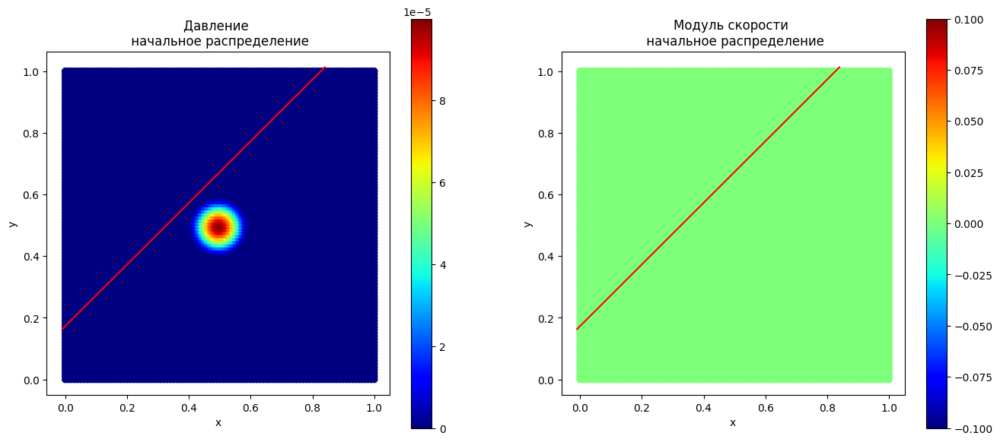

In [7]:
edges_data = []

for y_index in range(N_y + 1):
    prom_data = []
    for x_index in range(N_x + 1):
        prom_k_rho = border_params(x=(x_index * hx), y=(y_index * hy))
        prom_data.append(Edge(position_data=[x_index / N_x, y_index / N_y], values=[initial_pressure_function(x=x_index / N_x, y=y_index / N_y), 0, 0], params=prom_k_rho))
    edges_data.append(prom_data)

edges_data = np.array(edges_data)



initial_data = np.array([j.get_values()  for i in edges_data for j in i])
data_positions = np.array([j.get_position()  for i in edges_data for j in i])
names_list = ['Давление', 'Модуль скорости']
fig = plt.figure(figsize=(16, 7))
axs = fig.subplots(1, 2)


x_border_line_dots = [-0.01, 0.84]
y_border_line_dots = [i * border_line_params[0] + border_line_params[1] for i in x_border_line_dots]

for ax, i in zip(axs, range(2)):
    if i == 0:
        line = ax.scatter(x=data_positions[:, 0], y=data_positions[:, 1], c=initial_data[:, i], cmap='jet')
    else:
        line = ax.scatter(x=data_positions[:, 0], y=data_positions[:, 1], c=np.sqrt(initial_data[:, i] ** 2 + initial_data[:, i + 1] ** 2), cmap='jet')
    ax.set_title(f'{names_list[i]} \n начальное распределение')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_aspect('equal')
    # ax.set_facecolor('#222')
    ax.plot(x_border_line_dots, y_border_line_dots, color = 'red')
    # ax.axvline(x=x_border_data[0], color = 'red')
    fig.colorbar(line)
plt.show()

# Метод расщепления по пространству

In [8]:
def second_interpolation(cur_sigma: float, values_n1: np.ndarray, values_0: np.ndarray, values_p1: np.ndarray, revers: bool = False) -> np.ndarray:
    """
    Функция интерполяции второго порядка точности.
    Параметры:
        cur_sigma (float): параметр схемы - число Куранта;
        values_n1 (list[float]): (i - 1)-е значения инвариантов;
        values_0 (list[float]): i-е значения инвариантов; 
        values_p1 (list[float]): (i + 1)-е значения инварианто;
        revers (bool): флаг для расчета при отрицательном собственном значении.
    """
    if revers:
        return values_0 - 0.5 * cur_sigma * ((values_n1 - values_p1) - cur_sigma * (values_p1 - 2 * values_0 + values_n1))
    else:
        return values_0 - 0.5 * cur_sigma * ((values_p1 - values_n1) - cur_sigma * (values_n1 - 2 * values_0 + values_p1))

    #  un+1 = um − 1 2σ((um+1 −um−1)−σ(um−1 −2um +um+1)),


def second_order_characteristic(edge_n1: Edge, edge_0: Edge, edge_p1: Edge, y_axis: bool = False) -> list[float]:
    """
    Функция для вычислени искомых значений при расщеплении по пространству.
    По умолчанию расчет происходит для оси OX.
    Параметры:
        edge_n1 (Edge): (i - 1) - я ячейка;
        edge_0 (Edge): i-я ячейка; 
        edge_p1 (Edge): (i + 1) - я ячейка;
        y_axis (bool): флаг для расчета по оси OY вместо оси OX.
    """
    k_cur, rho_cur = edge_0.get_params()
    Z = np.sqrt(k_cur * rho_cur)
    c = np.sqrt(k_cur / rho_cur)

    values_n1 = np.array(edge_n1.get_values()).reshape(-1, 1)
    values_0 = np.array(edge_0.get_values()).reshape(-1, 1)
    values_p1 = np.array(edge_p1.get_values()).reshape(-1, 1)
    omega_matrix = None

    if y_axis:
        omega_matrix = np.array([[Z, -Z,  0],
                                 [0,  0,  1],
                                 [1,  1,  0]])
    else:
        omega_matrix = np.array([[Z, -Z,  0],
                                 [1,  1,  0],
                                 [0,  0,  1]])
        
    
    # inv_n1 = np.matmul(omega_matrix, values_n1).reshape(-1)
    # inv_0 = np.matmul(omega_matrix, values_0).reshape(-1)
    # inv_p1 = np.matmul(omega_matrix, values_p1).reshape(-1)
    
    inv_n1 = np.matmul(np.linalg.inv(omega_matrix), values_n1).reshape(-1)
    inv_0 = np.matmul(np.linalg.inv(omega_matrix), values_0).reshape(-1)
    inv_p1 = np.matmul(np.linalg.inv(omega_matrix), values_p1).reshape(-1)

    cur_sigma = tau * c * (N_x)
    new_inv_0 = np.array([second_interpolation(cur_sigma=cur_sigma, values_n1=inv_n1[0], values_0=inv_0[0], values_p1=inv_p1[0]), 
                          second_interpolation(cur_sigma=cur_sigma, values_n1=inv_n1[1], values_0=inv_0[1], values_p1=inv_p1[1], revers=True),
                          inv_0[2]])

    # return np.array(np.matmul(np.linalg.inv(omega_matrix), new_inv_0.reshape(-1, 1))).reshape(-1)

    return np.array(np.matmul(omega_matrix, new_inv_0.reshape(-1, 1))).reshape(-1)

In [9]:
def new_vields_values(values: list[float], current_theta: float) -> list[float]:
    """
    Функция возвращает новые значения полей согласно углу между нормалью к границе в точке и оси OX.
    Параметры:
        values (list[float]): исходные поля [p, u, v];
        current_theta (float): угол между нормалью к границе в точке и осью OX.
    """
    new_p = values[0]
    new_u = values[1] * np.cos(current_theta) - values[2] * np.sin(current_theta)
    new_v = values[1] * np.sin(current_theta) + values[2] * np.cos(current_theta)

    # new_u = values[1] * np.cos(current_theta) + values[2] * np.sin(current_theta)
    # new_v = -values[1] * np.sin(current_theta) + values[2] * np.cos(current_theta)

    return [new_p, new_u, new_v]

def first_border_derivative(x: float, y: float, y_regime: bool = False) -> float:
    """
    Функция задает форму перовй производной границы в точке.
    Параметры:
        x (float): координата x;
        y (float): координата y;
        y_regime (bool): параметр для того, чтобы указать, в какой зависимости выдавать производную: x = hi(y) или y = psi(x); по умолчанию выдается hi(y).
    """
    if y_regime:
        return border_line_params[0]
    else:
        return 1 / border_line_params[0]

def second_polinoms(k_rho_1: list[float], k_rho_2: list[float], edge_n1: Edge, edge_0: Edge, edge_p1: Edge, current_theta: float, x_border: float, y_border: float, y_axis: bool = False):
    """
    Функция для построения полиномов.
    Параметры:
        k_rho_1 (list[float]): массив параметров стреды до разрыва, хранится ввиде [k, rho];
        k_rho_2 (list[float]): массив параметров стреды после разрыва, хранится ввиде [k, rho];
        edge_n1 (Edge): Экземпяр кслааса для первой точки от границы влево;
        edge_0 (Edge): Экземпяр кслааса для расчетной;
        edge_p1 (Edge): Экземпяр кслааса для первой точки от границы вправо;
        current_theta (float): текущий угол нормали относительно ости OX в данной точке у границы;
        x_border (float): координата разрыва по оси OX;
        y_border (float): координата разрыва по оси OY;
        y_axis (bool): Параметр, True при расчете для оси OY.
    Возвращает коэффициенты полиномов [p, new_v, new_u]
    Полином 2-го порядка: Q = alpha * z^2 + beta * z * gamma
    Где z = sqrt((x - xb) ** 2 + (y - yb) ** 2)
    """
    value_n1 = edge_n1.get_values()
    value_0 = edge_0.get_values()
    value_p1 = edge_p1.get_values()
    square_sound_velocity_1 = k_rho_1[0] / k_rho_1[1]
    square_sound_velocity_2 = k_rho_2[0] / k_rho_2[1]

    new_value_n1 = new_vields_values(values=value_n1, current_theta=current_theta)
    new_value_0 = new_vields_values(values=value_0, current_theta=current_theta)
    new_value_p1 = new_vields_values(values=value_p1, current_theta=current_theta)

    # delta_n1 = np.sqrt(np.sum((np.array(edge_n1.get_position()) - np.array([x_border, y_border])) ** 2))
    # delta_0 = np.sqrt(np.sum((np.array(edge_0.get_position()) - np.array([x_border, y_border])) ** 2))
    # delta_p1 = np.sqrt(np.sum((np.array(edge_p1.get_position()) - np.array([x_border, y_border])) ** 2))

    delta_n1 = None
    delta_0 = None
    delta_p1 = None

    polinoms_koefs = []
    if y_axis:
        delta_n1 = edge_n1.get_position()[1] - y_border
        delta_0 = edge_0.get_position()[1] - y_border
        delta_p1 = edge_p1.get_position()[1] - y_border

        cos_1der_sin = lambda x_b, y_b: first_border_derivative(x_b, y_b, y_regime=True) * np.cos(current_theta) - np.sin(current_theta)
        sin_1der_cos = lambda x_b, y_b: first_border_derivative(x_b, y_b, y_regime=True) * np.sin(current_theta) + np.cos(current_theta)
        l_1der_2der = lambda x_b, y_b: (1 + (first_border_derivative(x_b, y_b, y_regime=True) ** 2)) 
        coscos_der_sinsin_sin2 = lambda x_b, y_b: np.cos(current_theta) ** 2 + (first_border_derivative(x_b, y_b, y_regime=True) ** 2) * (np.sin(current_theta) ** 2) + first_border_derivative(x_b, y_b, y_regime=True) * np.sin(2 * current_theta)

        

        # С учетом углов
        py1 = (-np.sin(current_theta)) * cos_1der_sin(x_border, y_border) / k_rho_1[1] + np.cos(current_theta) * sin_1der_cos(x_border, y_border)
        py2 = (-np.sin(current_theta)) * cos_1der_sin(x_border, y_border) / k_rho_2[1] + np.cos(current_theta) * sin_1der_cos(x_border, y_border)
        pyy1 = (-np.sin(current_theta)) * l_1der_2der(x_border, y_border) * square_sound_velocity_1 + np.cos(current_theta) * coscos_der_sinsin_sin2(x_border, y_border)
        pyy2 = (-np.sin(current_theta)) * l_1der_2der(x_border, y_border) * square_sound_velocity_2 + np.cos(current_theta) * coscos_der_sinsin_sin2(x_border, y_border)

        # Просто сумма
        # py1 = (np.cos(current_theta) - np.sin(current_theta) / k_rho_1[1]) + (np.sin(current_theta) + np.cos(current_theta) / k_rho_1[1])* first_border_derivative(x_border, y_border, y_regime=True)
        # py2 = (np.cos(current_theta) - np.sin(current_theta) / k_rho_2[1]) + (np.sin(current_theta) + np.cos(current_theta) / k_rho_2[1])* first_border_derivative(x_border, y_border, y_regime=True)
        # pyy1 = (square_sound_velocity_1 + np.cos(current_theta) ** 2) + (first_border_derivative(x_border, y_border, y_regime=True) ** 2) * (square_sound_velocity_1 + np.sin(current_theta) ** 2) + first_border_derivative(x_border, y_border, y_regime=True) * np.sin(2 * current_theta)
        # pyy2 = (square_sound_velocity_2 + np.cos(current_theta) ** 2) + (first_border_derivative(x_border, y_border, y_regime=True) ** 2) * (square_sound_velocity_2 + np.sin(current_theta) ** 2) + first_border_derivative(x_border, y_border, y_regime=True) * np.sin(2 * current_theta)        
        f_vector = np.array([new_value_n1[0], new_value_0[0], new_value_p1[0], 0, 0, 0]).reshape(-1, 1)
        M_matrix = [[delta_n1 ** 2, delta_n1, 1, 0, 0, 0],
                    [delta_0 ** 2 , delta_0 , 1, 0, 0, 0],
                    [0, 0, 0, delta_p1 ** 2, delta_p1, 1],
                    [0, 0, 1, 0, 0, -1],
                    [0, py1, 0, 0, -py2, 0],
                    [pyy1, 0, 0, -pyy2, 0, 0]]
        polinoms_koefs.append(solve(M_matrix, f_vector).flatten())

        # Расчет полинома v
        f_vector = np.array([new_value_n1[2], new_value_0[2], new_value_p1[2], 0, 0, 0]).reshape(-1, 1)

        # С учетом углов
        vy1 = k_rho_1[1] * np.cos(current_theta) * sin_1der_cos(x_border, y_border) + (-np.sin(current_theta)) * cos_1der_sin(x_border, y_border)
        vy2 = k_rho_2[1] * np.cos(current_theta) * sin_1der_cos(x_border, y_border) + (-np.sin(current_theta)) * cos_1der_sin(x_border, y_border)
        vyy1 = (-np.sin(current_theta)) * k_rho_1[0] * l_1der_2der(x_border, y_border) + k_rho_1[1] * np.cos(current_theta) * coscos_der_sinsin_sin2(x_border, y_border)
        vyy2 = (-np.sin(current_theta)) * k_rho_2[0] * l_1der_2der(x_border, y_border) + k_rho_2[1] * np.cos(current_theta) * coscos_der_sinsin_sin2(x_border, y_border)

        # Просто сумма
        # vy1 = (np.cos(current_theta) * k_rho_1[1] - np.sin(current_theta)) + (np.cos(current_theta) + np.sin(current_theta) * k_rho_1[1]) * first_border_derivative(x_border, y_border, y_regime=True)
        # vy2 = (np.cos(current_theta) * k_rho_2[1] - np.sin(current_theta)) + (np.cos(current_theta) + np.sin(current_theta) * k_rho_2[1]) * first_border_derivative(x_border, y_border, y_regime=True)
        # vyy1 = (k_rho_1[0] + k_rho_1[1] * np.cos(current_theta) ** 2) + (first_border_derivative(x_border, y_border, y_regime=True) ** 2) * (k_rho_1[0] + k_rho_1[1] * np.sin(current_theta) ** 2) + first_border_derivative(x_border, y_border, y_regime=True) * np.sin(2 * current_theta)
        # vyy2 = (k_rho_2[0] + k_rho_2[1] * np.cos(current_theta) ** 2) + (first_border_derivative(x_border, y_border, y_regime=True) ** 2) * (k_rho_2[0] + k_rho_2[1] * np.sin(current_theta) ** 2) + first_border_derivative(x_border, y_border, y_regime=True) * np.sin(2 * current_theta)        

        M_matrix = [[delta_n1 ** 2, delta_n1, 1, 0, 0, 0],
                    [delta_0 ** 2 , delta_0 , 1, 0, 0, 0],
                    [0, 0, 0, delta_p1 ** 2, delta_p1, 1],
                    [0, 0, k_rho_1[1], 0, 0, -k_rho_2[1]],
                    [0, vy1, 0, 0, -vy2, 0],
                    [vyy1, 0, 0, -vyy2, 0, 0]]
        V_polinoms = solve(M_matrix, f_vector).flatten()
        polinoms_koefs.append(V_polinoms)

        # Расчет полинома u
        
        uy1 = (-np.sin(current_theta)) * k_rho_1[0] * cos_1der_sin(x_border, y_border) + np.cos(current_theta) * sin_1der_cos(x_border, y_border)
        addition_1 = polinoms_koefs[1][1] * (-np.sin(current_theta)) * k_rho_1[0] * sin_1der_cos(x_border, y_border)          
        uy2 = (-np.sin(current_theta)) * k_rho_2[0] * cos_1der_sin(x_border, y_border) + np.cos(current_theta) * sin_1der_cos(x_border, y_border)
        addition_2 = polinoms_koefs[1][4] * (-np.sin(current_theta)) * k_rho_2[0] * sin_1der_cos(x_border, y_border)            
        uyy1 = square_sound_velocity_1 * (-np.sin(current_theta)) * l_1der_2der(x_border, y_border) + np.cos(current_theta) * coscos_der_sinsin_sin2(x_border, y_border)
        uyy2 = square_sound_velocity_2 * (-np.sin(current_theta)) * l_1der_2der(x_border, y_border) + np.cos(current_theta) * coscos_der_sinsin_sin2(x_border, y_border)


        f_vector = np.array([new_value_n1[1], new_value_0[1], new_value_p1[1], 0, addition_2 - addition_1, 0]).reshape(-1, 1)
        M_matrix = [[delta_n1 ** 2, delta_n1, 1, 0, 0, 0],
                    [delta_0 ** 2 , delta_0 , 1, 0, 0, 0],
                    [0, 0, 0, delta_p1 ** 2, delta_p1, 1],
                    [0, 0, 1, 0, 0, -1],
                    [0, uy1, 0, 0, -uy2, 0],
                    [uyy1, 0, 0, -uyy2, 0, 0]]
        polinoms_koefs.append(solve(M_matrix, f_vector).flatten())

    else:
        delta_n1 = edge_n1.get_position()[0] - x_border
        delta_0 = edge_0.get_position()[0] - x_border
        delta_p1 = edge_p1.get_position()[0] - x_border

        # Расчет полинома p
        f_vector = np.array([new_value_n1[0], new_value_0[0], new_value_p1[0], 0, 0, 0]).reshape(-1, 1)

        sin_1der_cos = lambda x_b, y_b: (np.sin(current_theta) + np.cos(current_theta) * first_border_derivative(x_b, y_b))
        cos_1der_sin = lambda x_b, y_b: (np.cos(current_theta) - np.sin(current_theta) * first_border_derivative(x_b, y_b))
        l_1der_2der = lambda x_b, y_b: (1 + (first_border_derivative(x_b, y_b) ** 2)) 
        sinsin_der_coscos_sin2 = lambda x_b, y_b: np.sin(current_theta) ** 2 + (first_border_derivative(x_b, y_b) ** 2) * (np.cos(current_theta) ** 2) + first_border_derivative(x_b, y_b) * np.sin(2 * current_theta)

        # С учетом углов
        px1 = np.sin(current_theta) * sin_1der_cos(x_border, y_border) + np.cos(current_theta) * cos_1der_sin(x_border, y_border) / k_rho_1[1]
        px2 = np.sin(current_theta) * sin_1der_cos(x_border, y_border) + np.cos(current_theta) * cos_1der_sin(x_border, y_border) / k_rho_2[1]
        pxx1 = square_sound_velocity_1 * (1 + l_1der_2der(x_border, y_border)) * np.cos(current_theta) + sinsin_der_coscos_sin2(x_border, y_border) * np.sin(current_theta)
        pxx2 = square_sound_velocity_2 * (1 + l_1der_2der(x_border, y_border)) * np.cos(current_theta) + sinsin_der_coscos_sin2(x_border, y_border) * np.sin(current_theta)

        # Просто сумма
        # px1 = (np.sin(current_theta) + np.cos(current_theta) * first_border_derivative(x_border, y_border)) + (np.cos(current_theta) - np.sin(current_theta) * first_border_derivative(x_border, y_border)) / k_rho_1[1]
        # px2 = (np.sin(current_theta) + np.cos(current_theta) * first_border_derivative(x_border, y_border)) + (np.cos(current_theta) - np.sin(current_theta) * first_border_derivative(x_border, y_border)) / k_rho_2[1]
        # pxx1 = (square_sound_velocity_1 + np.sin(current_theta) ** 2) + (first_border_derivative(x_border, y_border) ** 2) * (square_sound_velocity_1 + np.cos(current_theta) ** 2) + first_border_derivative(x_border, y_border) * np.sin(2 * current_theta)
        # pxx2 = (square_sound_velocity_2 + np.sin(current_theta) ** 2) + (first_border_derivative(x_border, y_border) ** 2) * (square_sound_velocity_2 + np.cos(current_theta) ** 2) + first_border_derivative(x_border, y_border) * np.sin(2 * current_theta)        

        M_matrix = [[delta_n1 ** 2, delta_n1, 1, 0, 0, 0],
                    [delta_0 ** 2 , delta_0 , 1, 0, 0, 0],
                    [0, 0, 0, delta_p1 ** 2, delta_p1, 1],
                    [0, 0, 1, 0, 0, -1],
                    [0, px1, 0, 0, -px2, 0],
                    [pxx1, 0, 0, -pxx2, 0, 0]]
        polinoms_koefs.append(solve(M_matrix, f_vector).flatten())

        # Расчет полинома v
        f_vector = np.array([new_value_n1[2], new_value_0[2], new_value_p1[2], 0, 0, 0]).reshape(-1, 1)
        
        # С учетом углов
        vx1 = k_rho_1[1] * np.sin(current_theta) * sin_1der_cos(x_border, y_border) + np.cos(current_theta) * cos_1der_sin(x_border, y_border)
        vx2 = k_rho_2[1] * np.sin(current_theta) * sin_1der_cos(x_border, y_border) + np.cos(current_theta) * cos_1der_sin(x_border, y_border)
        vxx1 = k_rho_1[0] * (1 + l_1der_2der(x_border, y_border)) * np.cos(current_theta) + sinsin_der_coscos_sin2(x_border, y_border) * np.sin(current_theta) * k_rho_1[1]
        vxx2 = k_rho_2[0] * (1 + l_1der_2der(x_border, y_border)) * np.cos(current_theta) + sinsin_der_coscos_sin2(x_border, y_border) * np.sin(current_theta) * k_rho_2[1]

        # Просто сумма
        # vx1 = k_rho_1[1] * (np.sin(current_theta) + np.cos(current_theta) * first_border_derivative(x_border, y_border)) + (np.cos(current_theta) - np.sin(current_theta) * first_border_derivative(x_border, y_border))
        # vx2 = k_rho_2[1] * (np.sin(current_theta) + np.cos(current_theta) * first_border_derivative(x_border, y_border)) + (np.cos(current_theta) - np.sin(current_theta) * first_border_derivative(x_border, y_border))        
        # vxx1 = (k_rho_1[0] + k_rho_1[1] * np.sin(current_theta) ** 2) + (first_border_derivative(x_border, y_border) ** 2) * (k_rho_1[0] + k_rho_1[1] * np.cos(current_theta) ** 2) + first_border_derivative(x_border, y_border) * np.sin(2 * current_theta)
        # vxx2 = (k_rho_2[0] + k_rho_2[1] * np.sin(current_theta) ** 2) + (first_border_derivative(x_border, y_border) ** 2) * (k_rho_2[0] + k_rho_2[1] * np.cos(current_theta) ** 2) + first_border_derivative(x_border, y_border) * np.sin(2 * current_theta)        

        M_matrix = [[delta_n1 ** 2, delta_n1, 1, 0, 0, 0],
                    [delta_0 ** 2 , delta_0 , 1, 0, 0, 0],
                    [0, 0, 0, delta_p1 ** 2, delta_p1, 1],
                    [0, 0, k_rho_1[1], 0, 0, -k_rho_2[1]],
                    [0, vx1, 0, 0, -vx2, 0],
                    [vxx1, 0, 0, -vxx2, 0, 0]]
        V_polinoms = solve(M_matrix, f_vector).flatten()
        polinoms_koefs.append(V_polinoms)

        # Расчет полинома u
        
        ux1 = np.sin(current_theta) * sin_1der_cos(x_border, y_border) + np.cos(current_theta) * k_rho_1[0] * cos_1der_sin(x_border, y_border)
        addition_1 = polinoms_koefs[1][1] * k_rho_1[0] * np.cos(current_theta) * sin_1der_cos(x_border, y_border)          
        ux2 = np.sin(current_theta) * sin_1der_cos(x_border, y_border) + np.cos(current_theta) * k_rho_2[0] * cos_1der_sin(x_border, y_border)
        addition_2 = polinoms_koefs[1][4] * k_rho_2[0] * np.cos(current_theta) * sin_1der_cos(x_border, y_border)         
        uxx1 = square_sound_velocity_1 * np.cos(current_theta) * (1 + l_1der_2der(x_border, y_border)) + np.sin(current_theta) * sinsin_der_coscos_sin2(x_border, y_border)
        uxx2 = square_sound_velocity_2 * np.cos(current_theta) * (1 + l_1der_2der(x_border, y_border)) + np.sin(current_theta) * sinsin_der_coscos_sin2(x_border, y_border)
        

        f_vector = np.array([new_value_n1[1], new_value_0[1], new_value_p1[1], 0, addition_2 - addition_1, 0]).reshape(-1, 1)
        M_matrix = [[delta_n1 ** 2, delta_n1, 1, 0, 0, 0],
                    [delta_0 ** 2 , delta_0 , 1, 0, 0, 0],
                    [0, 0, 0, delta_p1 ** 2, delta_p1, 1],
                    [0, 0, 1, 0, 0, -1],
                    [0, ux1, 0, 0, -ux2, 0],
                    [uxx1, 0, 0, -uxx2, 0, 0]]
        polinoms_koefs.append(solve(M_matrix, f_vector).flatten())

    return np.array(polinoms_koefs).reshape(3, 6)

In [10]:
def get_polinom_value(koefs_data: list[float], point_position: float, border_position: float) -> float:
    """
    Возвращает значения в соответсвии с построенным полиномом в точке.
    Параметры:
        koefs_data (list[float]): коэффициенты полинома;
        point_position (float): точка, в которой нужно рассчитать значение;
        border_position (float): точка разрыва.
    """
    delta_value = point_position - border_position
    value = 0
    new_koefs = list(reversed(koefs_data))
    for i in range(len(koefs_data)):
        value += (delta_value ** i) * new_koefs[i]
    return value

# Дальше два блока про третий порядок

In [11]:


def scheme_Rusanov_delta_positive(cur_sigma: float, values_n2: np.ndarray, values_n1: np.ndarray, values_0: np.ndarray, values_p1: np.ndarray):
    """
    Метод, реализующий схему Русанова 3-го порядка малости.
    Случай собственного значения > 0.
    Где delta = u_(i-1) - u_i
    Параметры:
        cur_sigma (float): параметр схемы - число Куранта;
        values_n2 (np.ndarray): узел через один в обратную сторону относительно m-го в момент времени t;
        values_n1 (np.ndarray): предыдущий узел относительно m-го в момент времени t;
        values_0 (np.ndarray): узел в момент времени t, для которого в момент времени t+1 ведется расчет;  
        values_p1 (Enp.ndarraydge): следующий узел относительно m-го в момент времени t;

                o      t+1
                |
        o---o---o---o  t
       m-2 m-1  m   m+1
      m_n2 m_n1 m   m_p1
    """

    delta_m = values_n1 - values_0
    delta_m_p1 = values_0 - values_p1
    delta_m_n1 = values_n2 - values_n1

    u_next = values_0 + 0.5 * cur_sigma * (delta_m + delta_m_p1) + 0.5 * (cur_sigma ** 2) * (delta_m - delta_m_p1) + (1/6) * cur_sigma * (cur_sigma ** 2 - 1) * (delta_m_n1 - 2 * delta_m + delta_m_p1)
    return u_next 



def scheme_Rusanov_delta_negative(cur_sigma: float, values_n1: np.ndarray, values_0: np.ndarray, values_p1: np.ndarray, values_p2: np.ndarray):
    """
    Метод, реализующий схему Русанова 3-го порядка малости.
    Случай собственного значения < 0. Схема симметрична отражена относительно edge_m.
    Где delta = u_(i+1) - u_i
    Параметры:
        alpha_beta (float): параметры среды;
        values_n1 (np.ndarray): предыдущий узел относительно m-го в момент времени t;
        values_0 (np.ndarray): узел в момент времени t, для которого в момент времени t+1 ведется расчет;  
        values_p1 (np.ndarray): следующий узел относительно m-го в момент времени t;
        values_p2 (np.ndarray): узел через один вперед относительно m-го в момент времени t;

            o          t+1
            |    
        o---o---o---o  t
       m-1  m  m+1 m+2
      m_n1  m m_p1 m_p2
    """
    
    delta_m = values_p1 - values_0
    delta_m_p1 = values_0 - values_n1 
    delta_m_n1= values_p2 - values_p1

    u_next = values_0 + 0.5 * cur_sigma * (delta_m + delta_m_p1) + 0.5 * (cur_sigma ** 2) * (delta_m - delta_m_p1) + (1/6) * cur_sigma * (cur_sigma ** 2 - 1) * (delta_m_n1 - 2 * delta_m + delta_m_p1)
    return u_next 



def characteristic(edge_n2: Edge, edge_n1: Edge, edge_0: Edge, edge_p1: Edge, edge_p2: Edge, y_axis: bool = False) -> list[float]:
    """
    Функция для вычислени искомых значений при расщеплении по пространству.
    По умолчанию расчет происходит для оси OX.
    Параметры:
        edge_n2 (Edge): (i - 2) - я ячейка;
        edge_n1 (Edge): (i - 1) - я ячейка;
        edge_0 (Edge): i-я ячейка; 
        edge_p1 (Edge): (i + 1) - я ячейка;
        edge_p2 (Edge): (i + 2) - я ячейка;
        y_axis (bool): флаг для расчета по оси OY вместо оси OX.
    """

    Z = np.sqrt(k * rho)
    c = np.sqrt(k / rho)

    values_n2 = np.array(edge_n2.get_values()).reshape(-1, 1)
    values_n1 = np.array(edge_n1.get_values()).reshape(-1, 1)
    values_0 = np.array(edge_0.get_values()).reshape(-1, 1)
    values_p1 = np.array(edge_p1.get_values()).reshape(-1, 1)
    values_p2 = np.array(edge_p2.get_values()).reshape(-1, 1)

    omega_matrix = None

    if y_axis:
        omega_matrix = np.array([[Z, -Z,  0],
                                 [0,  0,  1],
                                 [1,  1,  0]])
    else:
        omega_matrix = np.array([[Z, -Z,  0],
                                 [1,  1,  0],
                                 [0,  0,  1]])
        
    
    # inv_n1 = np.matmul(omega_matrix, values_n1).reshape(-1)
    # inv_0 = np.matmul(omega_matrix, values_0).reshape(-1)
    # inv_p1 = np.matmul(omega_matrix, values_p1).reshape(-1)
    
    inv_n2 = np.matmul(np.linalg.inv(omega_matrix), values_n2).reshape(-1)
    inv_n1 = np.matmul(np.linalg.inv(omega_matrix), values_n1).reshape(-1)
    inv_0 = np.matmul(np.linalg.inv(omega_matrix), values_0).reshape(-1)
    inv_p1 = np.matmul(np.linalg.inv(omega_matrix), values_p1).reshape(-1)
    inv_p2 = np.matmul(np.linalg.inv(omega_matrix), values_p2).reshape(-1)

    new_inv_0 = np.array([scheme_Rusanov_delta_positive(cur_sigma=sigma, values_n2=inv_n2[0], values_n1=inv_n1[0], values_0=inv_0[0], values_p1=inv_p1[0]), 
                          scheme_Rusanov_delta_negative(cur_sigma=sigma, values_n1=inv_n1[1], values_0=inv_0[1], values_p1=inv_p1[1], values_p2=inv_p2[1]),
                          inv_0[2]])

    # return np.array(np.matmul(np.linalg.inv(omega_matrix), new_inv_0.reshape(-1, 1))).reshape(-1)

    return np.array(np.matmul(omega_matrix, new_inv_0.reshape(-1, 1))).reshape(-1)
    

In [12]:
def polinoms_mid(k_rho_1: list[float], k_rho_2: list[float], edge_n2: Edge, edge_n1: Edge, edge_p1: Edge, edge_p2: Edge, border_pos: list[float]) -> list[list[float]]:
    """
    Функция строит полиномы скоростей и давления.
    Строит полиномы и возвращает список из списков коэффициентов для каждого полинома.
    Параметры:
        k_rho_1 (list[float]): массив параметров стреды до разрыва, хранится ввиде [k, rho];
        k_rho_2 (list[float]): массив параметров стреды после разрыва, хранится ввиде [k, rho];
        edge_n2 (Edge): Экземпяр кслааса для второй точки от границы влево;
        edge_n1 (Edge): Экземпяр кслааса для первой точки от границы влево;
        edge_p1 (Edge): Экземпяр кслааса для первой точки от границы вправо;
        edge_p2 (Edge): Экземпяр кслааса для второй точки от границы вправо;
        border_pos (float): позиция разрыва.
        
          |
          |
    o---o-|-o---o
    n2 n1 | p1  p2
          |
        border

    Полином имеет вид:
        Q(x) = a * (x - x_border) ** 3 + b * (x - x_border) ** 2 + c * (x - x_border) + d
    Будем решать систему для 8 неизвестных с 8ю уравнениями, где неизвестные:
    a1, b1, c1, d1, a2, b2, c2, d2.

    Возвращает:
    polinoms_data = [presure_koefs, u_velosity_koefs, v_velosity_koefs]
    """
    polinoms_data = np.array([])
    square_sound_velocity_1 = k_rho_1[0] / k_rho_1[1]
    square_sound_velocity_2 = k_rho_2[0] / k_rho_2[1]

    delta_x_n2 = np.sum((np.array(edge_n2.get_position()) - np.array(border_pos)) ** 2)
    delta_x_n1 = np.sum((np.array(edge_n1.get_position()) - np.array(border_pos)) ** 2)
    delta_x_p1 = np.sum((np.array(edge_p1.get_position()) - np.array(border_pos)) ** 2)
    delta_x_p2 = np.sum((np.array(edge_p2.get_position()) - np.array(border_pos)) ** 2)

    u_n2 = edge_n2.get_values()
    u_n1 = edge_n1.get_values()
    u_p1 = edge_p1.get_values() 
    u_p2 = edge_p2.get_values()

    # Полином давления
    f_vector = [u_n2[0], u_n1[0], u_p1[0], u_p2[0], 0, 0, 0, 0]
    Matrix = [[delta_x_n2 ** 3, delta_x_n2 ** 2, delta_x_n2, 1, 0, 0, 0, 0],
              [delta_x_n1 ** 3, delta_x_n1 ** 2, delta_x_n1, 1, 0, 0, 0, 0],
              [0, 0, 0, 0, delta_x_p1 ** 3, delta_x_p1 ** 2, delta_x_p1, 1],
              [0, 0, 0, 0, delta_x_p2 ** 3, delta_x_p2 ** 2, delta_x_p2, 1],
              [0, 0, 0, 1, 0, 0, 0, -1],
              [0, 0, 1 / k_rho_1[1], 0, 0, 0, -1 / k_rho_2[1], 0],
              [0, square_sound_velocity_1, 0, 0, 0, -square_sound_velocity_2, 0, 0],
              [square_sound_velocity_1 / k_rho_1[1], 0, 0, 0, -square_sound_velocity_2 / k_rho_2[1], 0, 0, 0]]
    
    np.append(polinoms_data, solve(Matrix, f_vector))

    # Полином скорости u
    f_vector = [u_n2[1], u_n1[1], u_p1[1], u_p2[1], 0, 0, 0, 0]
    Matrix = [[delta_x_n2 ** 3, delta_x_n2 ** 2, delta_x_n2, 1, 0, 0, 0, 0],
              [delta_x_n1 ** 3, delta_x_n1 ** 2, delta_x_n1, 1, 0, 0, 0, 0],
              [0, 0, 0, 0, delta_x_p1 ** 3, delta_x_p1 ** 2, delta_x_p1, 1],
              [0, 0, 0, 0, delta_x_p2 ** 3, delta_x_p2 ** 2, delta_x_p2, 1],
              [0, 0, 0, 1, 0, 0, 0, -1],
              [0, 0, k_rho_1[0], 0, 0, 0, -k_rho_2[0], 0],
              [0, square_sound_velocity_1, 0, 0, 0, -square_sound_velocity_2, 0, 0],
              [k_rho_1[0] * square_sound_velocity_1, 0, 0, 0, -k_rho_2[0] * square_sound_velocity_2, 0, 0, 0]]
    
    np.append(polinoms_data, solve(Matrix, f_vector))

    # Полином скорости v
    f_vector = [u_n2[2], u_n1[2], u_p1[2], u_p2[2], 0, 0, 0, 0]
    Matrix = [[delta_x_n2 ** 3, delta_x_n2 ** 2, delta_x_n2, 1, 0, 0, 0, 0],
              [delta_x_n1 ** 3, delta_x_n1 ** 2, delta_x_n1, 1, 0, 0, 0, 0],
              [0, 0, 0, 0, delta_x_p1 ** 3, delta_x_p1 ** 2, delta_x_p1, 1],
              [0, 0, 0, 0, delta_x_p2 ** 3, delta_x_p2 ** 2, delta_x_p2, 1],
              [0, 0, 0, k_rho_1[1], 0, 0, 0, -k_rho_2[1]],
              [0, 0, 1, 0, 0, 0, -1, 0],
              [0, k_rho_1[0], 0, 0, 0, -k_rho_2[0], 0, 0],
              [square_sound_velocity_1, 0, 0, 0, -square_sound_velocity_2, 0, 0, 0]]
    
    np.append(polinoms_data, solve(Matrix, f_vector))

    return polinoms_data.reshape(3, 8)





def polinoms_far(k_rho_1: list[float], k_rho_2: list[float], edge_n2: Edge, edge_n1: Edge, edge_n0: Edge, edge_p1: Edge, border_pos: list[float], reverse: bool = False) -> list[list[float]]:
    """
    Функция для апроксимации, если только одна точка находится за границей.
    Строит полиномы и возвращает список из списков коэффициентов для каждого полинома.
    Параметры:
        k_rho_1 (list[float]): массив параметров стреды до разрыва, хранится ввиде [k, rho];
        k_rho_2 (list[float]): массив параметров стреды после разрыва, хранится ввиде [k, rho];
        edge_n2 (Edge): Экземпяр кслааса для второй точки от границы влево;
        edge_n1 (Edge): Экземпяр кслааса для первой точки от границы влево;
        edge_n0 (Edge): Экземпяр кслааса для первой точки от границы вправо;
        edge_p2 (Edge): Экземпяр кслааса для второй точки от границы вправо;
        border_pos (float): позиция разрыва;
        reverse (bool): отраженная схема, изначанльна имеет вид первой нарисованной ниже. Чтобы поменять, необходимо переменную reverse перезаписать как True.

              |
              |
    o---o---o-|-o
    n2 n1   n0| p1
              |
            border

            Или

              |
              |
            o-|-o---o---o
            n2| n1  n0 p1
              |
            border


    Получаем полином для скорости.
    Полином имеет вид:
        P(x) = gamma * (x - x_border) ** 3 + delta * (x - x_border) ** 2 + psi * (x - x_border) + phi
    Будем решать систему для 8 неизвестных с 8ю уравнениями, где неизвестные:
    gamma1, delta1, psi1, phi1, gamma2, delta2, psi2, phi2.
    А уравнени системы:
        первые 4 - полученны из значений P(x),
        А второые 4 - получены из соотношений коэффициентов
    """
    polinoms_data = np.array([])
    square_sound_velocity_1 = k_rho_1[0] / k_rho_1[1]
    square_sound_velocity_2 = k_rho_2[0] / k_rho_2[1]

    delta_x_n2 = None
    delta_x_n1 = None
    delta_x_n0 = None
    delta_x_p1 = None

    u_n2 = None
    u_n1 = None
    u_n0 = None
    u_p1 = None

    if reverse:
        u_n2 = edge_p1.get_values()
        u_n1 = edge_n0.get_values()
        u_n0 = edge_n1.get_values() 
        u_p1 = edge_n2.get_values()

        delta_x_n2 = np.sum((np.array(edge_p1.get_position()) - np.array(border_pos)) ** 2)
        delta_x_n1 = np.sum((np.array(edge_n0.get_position()) - np.array(border_pos)) ** 2)
        delta_x_n0 = np.sum((np.array(edge_n1.get_position()) - np.array(border_pos)) ** 2)
        delta_x_p1 = np.sum((np.array(edge_n2.get_position()) - np.array(border_pos)) ** 2)

        alpha_beta_1, alpha_beta_2 = alpha_beta_2, alpha_beta_1
    else:
        u_n2 = edge_n2.get_values()
        u_n1 = edge_n1.get_values()
        u_n0 = edge_n0.get_values() 
        u_p1 = edge_p1.get_values()

        delta_x_n2 = np.sum((np.array(edge_n2.get_position()) - np.array(border_pos)) ** 2)
        delta_x_n1 = np.sum((np.array(edge_n1.get_position()) - np.array(border_pos)) ** 2)
        delta_x_n0 = np.sum((np.array(edge_n0.get_position()) - np.array(border_pos)) ** 2)
        delta_x_p1 = np.sum((np.array(edge_p1.get_position()) - np.array(border_pos)) ** 2)

    # Полином давления
    f_vector = np.array([u_n2[0], u_n1[0], u_n0[0], u_p1[0], 0, 0, 0, 0]).reshape(-1, 1)
    Matrix = np.array([[delta_x_n2 ** 3, delta_x_n2 ** 2, delta_x_n2, 1, 0, 0, 0, 0],
                  [delta_x_n1 ** 3, delta_x_n1 ** 2, delta_x_n1, 1, 0, 0, 0, 0],
                  [delta_x_n0 ** 3, delta_x_n0 ** 2, delta_x_n0, 1, 0, 0, 0, 0],
                  [0, 0, 0, 0, delta_x_p1 ** 3, delta_x_p1 ** 2, delta_x_p1, 1],
                  [0, 0, 0, 1, 0, 0, 0, -1],
                  [0, 0, 1 / k_rho_1[1], 0, 0, 0, -1 / k_rho_2[1], 0],
                  [0, square_sound_velocity_1, 0, 0, 0, -square_sound_velocity_2, 0, 0],
                  [square_sound_velocity_1 / k_rho_1[1], 0, 0, 0, -square_sound_velocity_2 / k_rho_2[1], 0, 0, 0]])
    
    if reverse:
        result = list(solve(Matrix, f_vector))
        np.append(polinoms_data, np.array(result[4:] + result[:4]))
    else:
        np.append(polinoms_data, solve(Matrix, f_vector))

    # Полином скорости u
    f_vector = [u_n2[1], u_n1[1], u_n0[1], u_p1[1], 0, 0, 0, 0]
    Matrix = [[delta_x_n2 ** 3, delta_x_n2 ** 2, delta_x_n2, 1, 0, 0, 0, 0],
              [delta_x_n1 ** 3, delta_x_n1 ** 2, delta_x_n1, 1, 0, 0, 0, 0],
              [delta_x_n0 ** 3, delta_x_n0 ** 2, delta_x_n0, 1, 0, 0, 0, 0],
              [0, 0, 0, 0, delta_x_p1 ** 3, delta_x_p1 ** 2, delta_x_p1, 1],
              [0, 0, 0, 1, 0, 0, 0, -1],
              [0, 0, k_rho_1[0], 0, 0, 0, -k_rho_2[0], 0],
              [0, square_sound_velocity_1, 0, 0, 0, -square_sound_velocity_2, 0, 0],
              [k_rho_1[0] * square_sound_velocity_1, 0, 0, 0, -k_rho_2[0] * square_sound_velocity_2, 0, 0, 0]]
    
    if reverse:
        result = list(solve(Matrix, f_vector))
        np.append(polinoms_data, np.array(result[4:] + result[:4]))
    else:
        np.append(polinoms_data, solve(Matrix, f_vector))

    # Полином скорости v
    f_vector = [u_n2[2], u_n1[2], u_n0[2], u_p1[2], 0, 0, 0, 0]
    Matrix = [[delta_x_n2 ** 3, delta_x_n2 ** 2, delta_x_n2, 1, 0, 0, 0, 0],
              [delta_x_n1 ** 3, delta_x_n1 ** 2, delta_x_n1, 1, 0, 0, 0, 0],
              [delta_x_n0 ** 3, delta_x_n0 ** 2, delta_x_n0, 1, 0, 0, 0, 0],
              [0, 0, 0, 0, delta_x_p1 ** 3, delta_x_p1 ** 2, delta_x_p1, 1],
              [0, 0, 0, k_rho_1[1], 0, 0, 0, -k_rho_2[1]],
              [0, 0, 1, 0, 0, 0, -1, 0],
              [0, k_rho_1[0], 0, 0, 0, -k_rho_2[0], 0, 0],
              [square_sound_velocity_1, 0, 0, 0, -square_sound_velocity_2, 0, 0, 0]]

    if reverse:
        result = list(solve(Matrix, f_vector))
        np.append(polinoms_data, np.array(result[4:] + result[:4]))
    else:
        np.append(polinoms_data, solve(Matrix, f_vector))

    return polinoms_data.reshape(3, 8)

    


In [13]:
def solf_system_for_Rimman_inv(params1: list[float], params2:list[float], cur_theta: float, w1p: float, w2n: float, w01: float = None, w02: float = None, y_axis: bool = False):
    """
    Функция для получения инвариантов на границе.
    Параметры:
        params1 (list[float]): список с параметрами слева;
        params2 (list[float]): список с параметрами справа;
        cur_theta (float): текущий угол;
        w1p (float): Положительный инвариант слева от границы; 
        w2n (float): Отрицательный инвариант справа от границы;
        w01 (float): Нулевой инвариант на границе слева; 
        w02 (float): Нулевой инвариант на границе справа; 
        y_axis (bool): Параметр показывающий расчет для оси OY, изначально в значении False => расчет для оси OX.
    """
    Z1 = np.sqrt(params1[1] * params1[0])
    Z2 = np.sqrt(params2[1] * params2[0])
    if y_axis:
        # A = Z1 * w1p + Z2 * w2n
        # B = -w2n * np.sin(theta) + w1p * np.sin(theta) 
        # C = w2n * np.cos(theta) * params2[1] - w1p * np.cos(theta) * params1[1]
        # f_vector = np.array([A, B, C]).reshape(-1, 1)
        # M_matrix = [[Z1, Z2, 0],
        #             [-np.sin(theta), np.sin(theta), 0],
        #             [params1[1] * np.cos(theta), -params2[1] * np.cos(theta), (params1[1] - params2[1]) * np.sin(theta)]]

        # A = Z1 * w1p + Z2 * w2n
        # B = -w2n * np.sin(theta) + w1p * np.sin(theta) + np.cos(theta) * (w02 - w01)
        # M_matrix = [[Z1, Z2],
        #             [-np.sin(theta), np.sin(theta)]]
        sin2_rho_sin = lambda cur_rho: (cur_rho - 1) * np.sin(2 * cur_theta)
        sinsin_rho_coscos = lambda cur_rho: np.sin(cur_theta) ** 2 + cur_rho * (np.cos(cur_theta) ** 2)

        A = Z1 * w1p + Z2 * w2n
        B = 0.5 * w02 * sin2_rho_sin(params2[1]) - 0.5 * w01 * sin2_rho_sin(params1[1]) + w2n * sinsin_rho_coscos(params2[1]) - w1p * sinsin_rho_coscos(params1[1])

        f_vector = np.array([A, B]).reshape(-1, 1)
        M_matrix = [[Z1, Z2],
                    [sinsin_rho_coscos(params1[1]), -sinsin_rho_coscos(params2[1])]]
        return solve(M_matrix, f_vector).flatten()
    else:
        # A = Z1 * w1p + Z2 * w2n
        # B = w2n * np.cos(theta) - w1p * np.cos(theta) 
        # C = w2n * np.sin(theta) * params2[1] - w1p * np.sin(theta) * params1[1]
        # f_vector = np.array([A, B, C]).reshape(-1, 1)
        # M_matrix = [[Z1, Z2, 0],
        #             [np.cos(theta), -np.cos(theta), 0],
        #             [params1[1] * np.sin(theta), -params2[1] * np.sin(theta), (params1[1] - params2[1]) * np.cos(theta)]]

        # A = Z1 * w1p + Z2 * w2n
        # B = w2n * np.cos(theta) - w1p * np.cos(theta) + np.sin(theta) * (w01 - w02)
        # M_matrix = [[Z1, Z2],
        #             [np.cos(theta), -np.cos(theta)]]

        sin2_rho_sin = lambda cur_rho: (cur_rho - 1) * np.sin(2 * cur_theta)
        coscos_rho_sinsin = lambda cur_rho: np.cos(cur_theta) ** 2 + cur_rho * (np.sin(cur_theta) ** 2)

        A = Z1 * w1p + Z2 * w2n
        B = 0.5 * w02  * sin2_rho_sin(params2[1]) - 0.5 * w01 * sin2_rho_sin(params1[1]) + w2n * coscos_rho_sinsin(params2[1]) - w1p * coscos_rho_sinsin(params1[1])
        M_matrix = [[Z1, Z2],
                    [coscos_rho_sinsin(params1[1]), -coscos_rho_sinsin(params2[1])]]
        f_vector = np.array([A, B]).reshape(-1, 1)
        
        return solve(M_matrix, f_vector).flatten()

In [14]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))

"""Тут приходится повторять блок кода с заданием начальных значений, иначе ничего не работает"""
calc_data = []

for y_index in range(N_y + 1):
    prom_data = []
    for x_index in range(N_x + 1):
        prom_k_rho = border_params(x=(x_index * hx), y=(y_index * hy))
        prom_data.append(Edge(position_data=[x_index / N_x, y_index / N_y], values=[initial_pressure_function(x=x_index / N_x, y=y_index / N_y), 0, 0], params=prom_k_rho))
        # prom_data.append(Edge(position_data=[x_index / N_x, y_index / N_y], values=[initial_pressure_function(x=x_index / N_x, y=y_index / N_y), 0, 0], params=[rho, k]))
    calc_data.append(prom_data)

calc_data = np.array(calc_data)

initial_calc_data = np.array([j.get_values()  for i in calc_data for j in i])
data_positions = np.array([j.get_position()  for i in edges_data for j in i])
sc1 = ax1.scatter(x=data_positions[:, 0], y=data_positions[:, 1], c=initial_calc_data[:, 0], cmap='jet')
sc2 = ax2.scatter(x=data_positions[:, 0], y=data_positions[:, 1], c=np.sqrt(initial_calc_data[:, 1] ** 2 + initial_calc_data[:, 2] ** 2), cmap='jet')
ax1.plot(x_border_line_dots, y_border_line_dots, color = 'red')
ax2.plot(x_border_line_dots, y_border_line_dots, color = 'red')
# ax1.set_facecolor('#222')
# ax2.set_facecolor('#222')
ax1.set_title('Давление')
ax2.set_title('Модуль скорости')

ax1.set_aspect('equal')
ax2.set_aspect('equal')
time_template = 'time = %.2fs'
time_text = plt.text(-1.55, 1.1, '', transform=ax.transAxes)
sc1_colorbar = plt.colorbar(sc1)
sc2_colorbar = plt.colorbar(sc2)

def init():
    time_text.set_text('')
    return time_text

def update(frame): 
    if frame == 0:
        
        return 

    y_index, x_index  = calc_data.shape
    flag = True
    calc_values_data = []


    # Расчет для второго порядка
    # Сначала расчет для оси OX
    for y_current in range(2, y_index - 2):
        prom_data = []
        queue = deque()
        for x_current in range(2, x_index - 2):
            if flag and calc_data[y_current][x_current].get_params() != calc_data[y_current][x_current + 1].get_params():
                current_border_position = ((calc_data[y_current][x_current].get_position()[1] - border_line_params[1]) / border_line_params[0], calc_data[y_current][x_current].get_position()[1])
                P_koefs, V_koefs, U_koefs = second_polinoms(k_rho_1=calc_data[y_current][x_current].get_params(),
                                                            k_rho_2=calc_data[y_current][x_current + 1].get_params(),
                                                            edge_n1=calc_data[y_current][x_current - 1],
                                                            edge_0=calc_data[y_current][x_current],
                                                            edge_p1=calc_data[y_current][x_current + 1],
                                                            current_theta=-(0.5 * np.pi - theta),
                                                            x_border=current_border_position[0],
                                                            y_border=current_border_position[1])
                queue.append([P_koefs, V_koefs, U_koefs, calc_data[y_current][x_current].get_params(), calc_data[y_current][x_current + 1].get_params(), current_border_position, -(0.5 * np.pi - theta)])

                P_koefs, V_koefs, U_koefs = second_polinoms(k_rho_1=calc_data[y_current][x_current + 1].get_params(),
                                                            k_rho_2=calc_data[y_current][x_current].get_params(),
                                                            edge_n1=calc_data[y_current][x_current + 2],
                                                            edge_0=calc_data[y_current][x_current + 1],
                                                            edge_p1=calc_data[y_current][x_current],
                                                            current_theta=-(0.5 * np.pi - theta),
                                                            x_border=current_border_position[0],
                                                            y_border=current_border_position[1])
                queue.append([P_koefs, V_koefs, U_koefs, calc_data[y_current][x_current + 1].get_params(), calc_data[y_current][x_current].get_params(), current_border_position, -(0.5 * np.pi - theta)])
            # Расчет граничных точек
            if queue:
                # print(0)
                len_queue = len(queue)
                P_koefs, V_koefs, U_koefs, params1, params2, current_border_position, current_theta = queue.popleft()
                w_positive = None
                w_negative = None
                w_zero = calc_data[y_current][x_current].get_values()[2]
                # Точка слева от границы
                if len_queue == 2:
                    positive_point_position = calc_data[y_current][x_current].get_position()[0] - tau * np.sqrt(params1[0] / params1[1])
                    p_value = get_polinom_value(koefs_data=P_koefs[:3], point_position=positive_point_position, border_position=current_border_position[0])
                    u_new_value = get_polinom_value(koefs_data=U_koefs[:3], point_position=positive_point_position, border_position=current_border_position[0])
                    v_new_value = get_polinom_value(koefs_data=V_koefs[:3], point_position=positive_point_position, border_position=current_border_position[0])
                    Z = np.sqrt(params1[0] * params1[1])
                    w_positive = (p_value + Z * (np.cos(current_theta) * u_new_value + np.sin(current_theta) * v_new_value)) / (2 * Z)

                    negative_point_position = calc_data[y_current][x_current].get_position()[0] + tau * np.sqrt(params1[0] / params1[1])
                    # Проверка того, что характеристика попала на границу
                    if negative_point_position > current_border_position[0]:
                        t_tilda = tau - (current_border_position[0] - calc_data[y_current][x_current].get_position()[0]) / np.sqrt(params1[0] / params1[1])
                        Z1 = np.sqrt(params1[0] * params1[1])
                        Z2 = np.sqrt(params2[0] * params2[1])

                        left_point = current_border_position[0] - np.sqrt(params1[0] / params1[1]) * t_tilda
                        p_value = get_polinom_value(koefs_data=P_koefs[:3], point_position=left_point, border_position=current_border_position[0])
                        u_new_value = get_polinom_value(koefs_data=U_koefs[:3], point_position=left_point, border_position=current_border_position[0])
                        v_new_value = get_polinom_value(koefs_data=V_koefs[:3], point_position=left_point, border_position=current_border_position[0])
                        w1p = (p_value + Z1 * (np.cos(current_theta) * u_new_value + np.sin(current_theta) * v_new_value)) / (2 * Z1)
                        w01 = -np.sin(current_theta) * U_koefs[2] + np.cos(current_theta) * V_koefs[2]

                        right_point = current_border_position[0] + np.sqrt(params2[0] / params2[1]) * t_tilda
                        p_value = get_polinom_value(koefs_data=P_koefs[3:], point_position=right_point, border_position=current_border_position[0])
                        u_new_value = get_polinom_value(koefs_data=U_koefs[3:], point_position=right_point, border_position=current_border_position[0])
                        v_new_value = get_polinom_value(koefs_data=V_koefs[3:], point_position=right_point, border_position=current_border_position[0])
                        w2n = (-p_value + Z2 * (np.cos(current_theta) * u_new_value + np.sin(current_theta) * v_new_value)) / (2 * Z2)
                        w02 = -np.sin(current_theta) * U_koefs[5] + np.cos(current_theta) * V_koefs[5] 

                        w1n, w2p = solf_system_for_Rimman_inv(params1, params2, current_theta, w1p, w2n, w01, w02)
                        w_negative = (-Z * (w1p - w1n) + Z * (w1p + w1n)) / (2 * Z)
                    else:
                        p_value = get_polinom_value(koefs_data=P_koefs[:3], point_position=negative_point_position, border_position=current_border_position[0])
                        u_new_value = get_polinom_value(koefs_data=U_koefs[:3], point_position=negative_point_position, border_position=current_border_position[0])
                        v_new_value = get_polinom_value(koefs_data=V_koefs[:3], point_position=negative_point_position, border_position=current_border_position[0])
                        Z = np.sqrt(params1[0] * params1[1])
                        w_negative = (-p_value + Z * (np.cos(current_theta) * u_new_value + np.sin(current_theta) * v_new_value)) / (2 * Z)

                else:
                    # Точка справа от границы
                    negative_point_position = calc_data[y_current][x_current].get_position()[0] + tau * np.sqrt(params1[0] / params1[1])
                    p_value = get_polinom_value(koefs_data=P_koefs[:3], point_position=negative_point_position, border_position=current_border_position[0])
                    u_new_value = get_polinom_value(koefs_data=U_koefs[:3], point_position=negative_point_position, border_position=current_border_position[0])
                    v_new_value = get_polinom_value(koefs_data=V_koefs[:3], point_position=negative_point_position, border_position=current_border_position[0])
                    Z = np.sqrt(params1[0] * params1[1])
                    w_negative = (-p_value + Z * (np.cos(current_theta) * u_new_value + np.sin(current_theta) * v_new_value)) / (2 * Z)

                    positive_point_position = calc_data[y_current][x_current].get_position()[0] - tau * np.sqrt(params1[0] / params1[1])
                    # Проверка того, что характеристика попала на границу
                    if positive_point_position < current_border_position[0]:
                        t_tilda = tau + (current_border_position[0] - calc_data[y_current][x_current].get_position()[0]) / np.sqrt(params1[0] / params1[1])
                        Z1 = np.sqrt(params1[0] * params1[1])
                        Z2 = np.sqrt(params2[0] * params2[1])
                        # Т.к. это расчет для точки справа от границы, то тут left и right поменяны местами
                        right_point = current_border_position[0] + np.sqrt(params1[0] / params1[1]) * t_tilda
                        p_value = get_polinom_value(koefs_data=P_koefs[:3], point_position=right_point, border_position=current_border_position[0])
                        u_new_value = get_polinom_value(koefs_data=U_koefs[:3], point_position=right_point, border_position=current_border_position[0])
                        v_new_value = get_polinom_value(koefs_data=V_koefs[:3], point_position=right_point, border_position=current_border_position[0])
                        w2n = (-p_value + Z1 * (np.cos(current_theta) * u_new_value + np.sin(current_theta) * v_new_value)) / (2 * Z1)
                        w02 = -np.sin(current_theta) * U_koefs[2] + np.cos(current_theta) * V_koefs[2]
                        
                        left_point = current_border_position[0] - np.sqrt(params2[0] / params2[1]) * t_tilda
                        p_value = get_polinom_value(koefs_data=P_koefs[3:], point_position=left_point, border_position=current_border_position[0])
                        u_new_value = get_polinom_value(koefs_data=U_koefs[3:], point_position=left_point, border_position=current_border_position[0])
                        v_new_value = get_polinom_value(koefs_data=V_koefs[3:], point_position=left_point, border_position=current_border_position[0])
                        w1p = (p_value + Z2 * (np.cos(current_theta) * u_new_value + np.sin(current_theta) * v_new_value)) / (2 * Z2)
                        w01 = -np.sin(current_theta) * U_koefs[5] + np.cos(current_theta) * V_koefs[5] 

                        w1n, w2p = solf_system_for_Rimman_inv(params2, params1, current_theta, w1p, w2n, w01, w02)
                        w_positive = (Z * (w2p - w2n) + Z * (w2p + w2n)) / (2 * Z)
                        
                    else:
                        p_value = get_polinom_value(koefs_data=P_koefs[:3], point_position=positive_point_position, border_position=current_border_position[0])
                        u_new_value = get_polinom_value(koefs_data=U_koefs[:3], point_position=positive_point_position, border_position=current_border_position[0])
                        v_new_value = get_polinom_value(koefs_data=V_koefs[:3], point_position=positive_point_position, border_position=current_border_position[0])
                        Z = np.sqrt(params1[0] * params1[1])
                        w_positive = (p_value + Z * (np.cos(current_theta) * u_new_value + np.sin(current_theta) * v_new_value)) / (2 * Z)

                Z = np.sqrt(params1[0] * params1[1])
                omega_matrix = np.array([[Z, -Z,  0],
                                         [1,  1,  0],
                                         [0,  0,  1]])
                culc_values = np.array(np.matmul(omega_matrix, np.array([w_positive, w_negative, w_zero]).reshape(-1, 1))).flatten()
                prom_data.append(culc_values)
            else:
                # print(1)
                # Расчет обычных точек
                prom_data.append(second_order_characteristic(edge_n1=calc_data[y_current][x_current - 1],
                                                            edge_0=calc_data[y_current][x_current],
                                                            edge_p1=calc_data[y_current][x_current + 1]))
        calc_values_data.append(prom_data)

    for y_current in range(y_index):
        for x_current in range(x_index):
            if x_current > 1 and x_current < x_index - 2 and y_current > 1 and y_current < y_index - 2:
                calc_data[y_current][x_current].set_values(calc_values_data[y_current - 2][x_current - 2])
            else:
                pass

    # Теперь расчет для оси OY
    calc_values_data = []
    for x_current in range(2, x_index - 2):
        prom_data = []
        queue = deque()
        for y_current in range(2, y_index - 2):            
            if flag and calc_data[y_current][x_current].get_params() != calc_data[y_current + 1][x_current].get_params():
                current_border_position = (calc_data[y_current][x_current].get_position()[0], calc_data[y_current][x_current].get_position()[0] * border_line_params[0] + border_line_params[1])
                P_koefs, V_koefs, U_koefs = second_polinoms(k_rho_1=calc_data[y_current][x_current].get_params(),
                                                            k_rho_2=calc_data[y_current + 1][x_current].get_params(),
                                                            edge_n1=calc_data[y_current - 1][x_current],
                                                            edge_0=calc_data[y_current][x_current],
                                                            edge_p1=calc_data[y_current + 1][x_current],
                                                            current_theta=-(0.5 * np.pi - theta),
                                                            x_border=current_border_position[0],
                                                            y_border=current_border_position[1],
                                                            y_axis=True)
                queue.append([P_koefs, V_koefs, U_koefs, calc_data[y_current][x_current].get_params(), calc_data[y_current + 1][x_current].get_params(), current_border_position, -(0.5 * np.pi - theta)])

                P_koefs, V_koefs, U_koefs = second_polinoms(k_rho_1=calc_data[y_current + 1][x_current].get_params(),
                                                            k_rho_2=calc_data[y_current][x_current].get_params(),
                                                            edge_n1=calc_data[y_current + 2][x_current],
                                                            edge_0=calc_data[y_current + 1][x_current],
                                                            edge_p1=calc_data[y_current][x_current],
                                                            current_theta=-(0.5 * np.pi - theta),
                                                            x_border=current_border_position[0],
                                                            y_border=current_border_position[1],
                                                            y_axis=True)
                queue.append([P_koefs, V_koefs, U_koefs, calc_data[y_current + 1][x_current].get_params(), calc_data[y_current][x_current].get_params(), current_border_position, -(0.5 * np.pi - theta)])

            # Расчет граничных точек
            if queue:
                len_queue = len(queue)
                P_koefs, V_koefs, U_koefs, params1, params2, current_border_position, current_theta = queue.popleft()
                w_positive = None
                w_negative = None
                w_zero = calc_data[y_current][x_current].get_values()[1]
                # Точка слева от границы
                if len_queue == 2:
                    positive_point_position = calc_data[y_current][x_current].get_position()[1] - tau * np.sqrt(params1[0] / params1[1])
                    p_value = get_polinom_value(koefs_data=P_koefs[:3], point_position=positive_point_position, border_position=current_border_position[1])
                    u_new_value = get_polinom_value(koefs_data=U_koefs[:3], point_position=positive_point_position, border_position=current_border_position[1])
                    v_new_value = get_polinom_value(koefs_data=V_koefs[:3], point_position=positive_point_position, border_position=current_border_position[1])
                    Z = np.sqrt(params1[0] * params1[1])
                    w_positive = (p_value + Z * (-np.sin(current_theta) * u_new_value + np.cos(current_theta) * v_new_value)) / (2 * Z)

                    negative_point_position = calc_data[y_current][x_current].get_position()[1] + tau * np.sqrt(params1[0] / params1[1])
                    # Проверка того, что характеристика попала на границу
                    if negative_point_position > current_border_position[1]:
                        t_tilda = tau - (current_border_position[1] - calc_data[y_current][x_current].get_position()[1]) / np.sqrt(params1[0] / params1[1])
                        Z1 = np.sqrt(params1[0] * params1[1])
                        Z2 = np.sqrt(params2[0] * params2[1])

                        left_point = current_border_position[1] - np.sqrt(params1[0] / params1[1]) * t_tilda
                        p_value = get_polinom_value(koefs_data=P_koefs[:3], point_position=left_point, border_position=current_border_position[1])
                        u_new_value = get_polinom_value(koefs_data=U_koefs[:3], point_position=left_point, border_position=current_border_position[1])
                        v_new_value = get_polinom_value(koefs_data=V_koefs[:3], point_position=left_point, border_position=current_border_position[1])
                        w1p = (p_value + Z1 * (-np.sin(current_theta) * u_new_value + np.cos(current_theta) * v_new_value)) / (2 * Z1)
                        w01 = np.cos(current_theta) * U_koefs[2] + np.sin(current_theta) * V_koefs[2]

                        right_point = current_border_position[1] + np.sqrt(params2[0] / params2[1]) * t_tilda
                        p_value = get_polinom_value(koefs_data=P_koefs[3:], point_position=right_point, border_position=current_border_position[1])
                        u_new_value = get_polinom_value(koefs_data=U_koefs[3:], point_position=right_point, border_position=current_border_position[1])
                        v_new_value = get_polinom_value(koefs_data=V_koefs[3:], point_position=right_point, border_position=current_border_position[1])
                        w2n = (-p_value + Z2 * (-np.sin(current_theta) * u_new_value + np.cos(current_theta) * v_new_value)) / (2 * Z2)
                        w02 = np.cos(current_theta) * U_koefs[5] + np.sin(current_theta) * V_koefs[5]

                        w1n, w2p = solf_system_for_Rimman_inv(params1, params2, current_theta, w1p, w2n, w01, w02, y_axis=True)
                        w_negative = (-Z * (w1p - w1n) + Z * (w1p + w1n)) / (2 * Z)
                    else:
                        p_value = get_polinom_value(koefs_data=P_koefs[:3], point_position=negative_point_position, border_position=current_border_position[1])
                        u_new_value = get_polinom_value(koefs_data=U_koefs[:3], point_position=negative_point_position, border_position=current_border_position[1])
                        v_new_value = get_polinom_value(koefs_data=V_koefs[:3], point_position=negative_point_position, border_position=current_border_position[1])
                        Z = np.sqrt(params1[0] * params1[1])
                        w_negative = (-p_value + Z * (-np.sin(current_theta) * u_new_value + np.cos(current_theta) * v_new_value)) / (2 * Z)
                else:
                    # Точка справа от границы
                    negative_point_position = calc_data[y_current][x_current].get_position()[1] + tau * np.sqrt(params1[0] / params1[1])
                    p_value = get_polinom_value(koefs_data=P_koefs[:3], point_position=negative_point_position, border_position=current_border_position[1])
                    u_new_value = get_polinom_value(koefs_data=U_koefs[:3], point_position=negative_point_position, border_position=current_border_position[1])
                    v_new_value = get_polinom_value(koefs_data=V_koefs[:3], point_position=negative_point_position, border_position=current_border_position[1])
                    Z = np.sqrt(params1[0] * params1[1])
                    w_negative = (-p_value + Z * (-np.sin(current_theta) * u_new_value + np.cos(current_theta) * v_new_value)) / (2 * Z)

                    positive_point_position = calc_data[y_current][x_current].get_position()[1] - tau * np.sqrt(params1[0] / params1[1])
                    # Проверка того, что характеристика попала на границу
                    if positive_point_position < current_border_position[1]:
                        t_tilda = tau + (current_border_position[1] - calc_data[y_current][x_current].get_position()[1]) / np.sqrt(params1[0] / params1[1])
                        Z1 = np.sqrt(params1[0] * params1[1])
                        Z2 = np.sqrt(params2[0] * params2[1])
                        # Т.к. это расчет для точки справа от границы, то тут left и right поменяны местами
                        right_point = current_border_position[1] + np.sqrt(params1[0] / params1[1]) * t_tilda
                        p_value = get_polinom_value(koefs_data=P_koefs[:3], point_position=right_point, border_position=current_border_position[1])
                        u_new_value = get_polinom_value(koefs_data=U_koefs[:3], point_position=right_point, border_position=current_border_position[1])
                        v_new_value = get_polinom_value(koefs_data=V_koefs[:3], point_position=right_point, border_position=current_border_position[1])
                        w2n = (-p_value + Z1 * (-np.sin(current_theta) * u_new_value + np.cos(current_theta) * v_new_value)) / (2 * Z1)
                        w02 = np.cos(current_theta) * U_koefs[2] + np.sin(current_theta) * V_koefs[2]
                        
                        left_point = current_border_position[1] - np.sqrt(params2[0] / params2[1]) * t_tilda
                        p_value = get_polinom_value(koefs_data=P_koefs[3:], point_position=left_point, border_position=current_border_position[1])
                        u_new_value = get_polinom_value(koefs_data=U_koefs[3:], point_position=left_point, border_position=current_border_position[1])
                        v_new_value = get_polinom_value(koefs_data=V_koefs[3:], point_position=left_point, border_position=current_border_position[1])
                        w1p = (p_value + Z2 * (-np.sin(current_theta) * u_new_value + np.cos(current_theta) * v_new_value)) / (2 * Z2)
                        w01 = np.cos(current_theta) * U_koefs[5] + np.sin(current_theta) * V_koefs[5]

                        w1n, w2p = solf_system_for_Rimman_inv(params2, params1, current_theta, w1p, w2n, w01, w02, y_axis=True)
                        w_positive = (Z * (w2p - w2n) + Z * (w2p + w2n)) / (2 * Z)
                    else:
                        p_value = get_polinom_value(koefs_data=P_koefs[:3], point_position=positive_point_position, border_position=current_border_position[1])
                        u_new_value = get_polinom_value(koefs_data=U_koefs[:3], point_position=positive_point_position, border_position=current_border_position[1])
                        v_new_value = get_polinom_value(koefs_data=V_koefs[:3], point_position=positive_point_position, border_position=current_border_position[1])
                        Z = np.sqrt(params1[0] * params1[1])
                        w_positive = (p_value + Z * (-np.sin(current_theta) * u_new_value + np.cos(current_theta) * v_new_value)) / (2 * Z)
                Z = np.sqrt(params1[0] * params1[1])
                omega_matrix = np.array([[Z, -Z,  0],
                                         [0,  0,  1],
                                         [1,  1,  0]])
                # print([w_positive, w_negative, w_zero])
                culc_values = np.array(np.matmul(omega_matrix, np.array([w_positive, w_negative, w_zero]).reshape(-1, 1))).flatten()
                prom_data.append(culc_values)
            else:
                # Расчет обычных точек
                prom_data.append(second_order_characteristic(edge_n1=calc_data[y_current - 1][x_current],
                                                        edge_0=calc_data[y_current][x_current],
                                                        edge_p1=calc_data[y_current + 1][x_current],
                                                        y_axis=True))
        calc_values_data.append(prom_data)

    # calc_values_data = np.array(calc_values_data).T
    # p_data = calc_values_data[0]
    # u_data = calc_values_data[1]
    # v_data = calc_values_data[2]
    for x_current in range(x_index):
        for y_current in range(y_index):
            if x_current > 1 and x_current < x_index - 2 and y_current > 1 and y_current < y_index - 2:
                calc_data[y_current][x_current].set_values(calc_values_data[x_current - 2][y_current - 2])
            else:
                pass





    # Расчет для треьего порядка
    """# Сначала расчет для оси OX
    for y_current in range(2, y_index - 2):
        prom_data = []
        queue = deque()
        for x_current in range(2, x_index - 2):
            if queue:
                pass
            else:
                if calc_data[y_current][x_current + 1].get_params() != calc_data[y_current][x_current + 2].get_params():
                    pass
                else:
                    prom_data.append(characteristic(edge_n2=calc_data[y_current][x_current - 2],
                                                    edge_n1=calc_data[y_current][x_current - 1],
                                                    edge_0=calc_data[y_current][x_current],
                                                    edge_p1=calc_data[y_current][x_current + 1],
                                                    edge_p2=calc_data[y_current][x_current + 2]))
        calc_values_data.append(prom_data)

    for y_current in range(y_index):
        for x_current in range(x_index):
            if x_current > 1 and x_current < x_index - 2 and y_current > 1 and y_current < y_index - 2:
                calc_data[y_current][x_current].set_values(calc_values_data[y_current - 2][x_current - 2])
            else:
                pass


    # Теперь расчет для оси OY
    calc_values_data = []
    for y_current in range(2, y_index - 2):
        prom_data = []
        for x_current in range(2, x_index - 2):
            prom_data.append(characteristic(edge_n2=calc_data[y_current - 2][x_current],
                                            edge_n1=calc_data[y_current - 1][x_current],
                                            edge_0=calc_data[y_current][x_current],
                                            edge_p1=calc_data[y_current + 1][x_current],
                                            edge_p2=calc_data[y_current + 2][x_current],
                                            y_axis=True))
        calc_values_data.append(prom_data)

    for y_current in range(y_index):
        for x_current in range(x_index):
            if x_current > 1 and x_current < x_index - 2 and y_current > 1 and y_current < y_index - 2:
                calc_data[y_current][x_current].set_values(calc_values_data[y_current - 2][x_current - 2])
            else:
                pass"""

    print_data = np.array([j.get_values()  for i in calc_data for j in i])

    sc1.set_array(print_data[:, 0])
    sc2.set_array(np.sqrt(print_data[:, 1] ** 2 + print_data[:, 2] ** 2))
    # sc2.set_array(print_data[:, 1])

    sc1.set_clim(vmin=np.min(print_data[:, 0]), vmax=np.max(print_data[:, 0]))
    sc2.set_clim(vmin=np.min(np.sqrt(print_data[:, 1] ** 2 + print_data[:, 2] ** 2)), 
                 vmax=np.max(np.sqrt(print_data[:, 1] ** 2 + print_data[:, 2] ** 2)))

    sc1_colorbar.update_normal(sc1)
    sc2_colorbar.update_normal(sc2)
    time_text.set_text(time_template % (frame))    
    return sc1, sc2, time_text


ani = animation.FuncAnimation(fig, update, np.arange(0, 0.23, tau), interval=50000 * tau, init_func=init)  # 0.23
# plt.show()
plt.close()
HTML(ani.to_jshtml())
# writergif = animation.PillowWriter(fps=20) 
# ani.save('two_dimentions.gif', writer=writergif, progress_callback=lambda i, n: print(f'Saving frame {i}/{n}'))

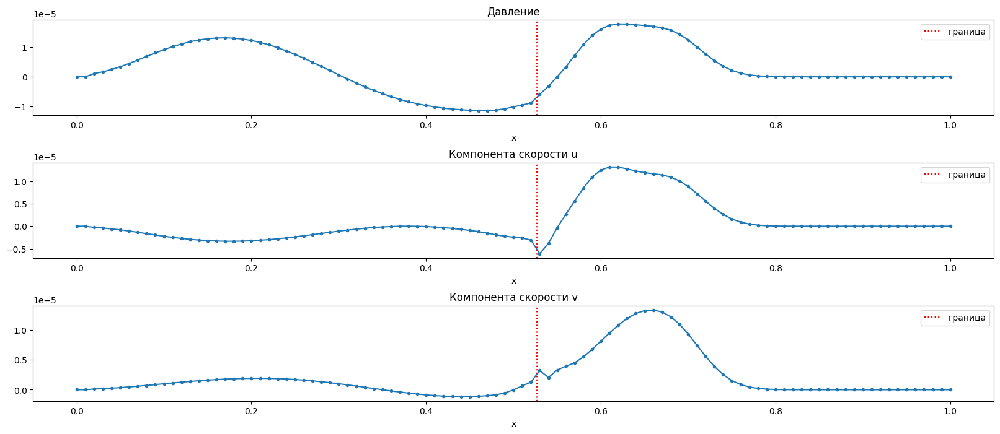

In [566]:
fig = plt.figure(figsize=(20, 8))
axss = fig.subplots(3, 1)
title = ['Давление', 'Компонента скорости u', 'Компонента скорости v']

point_num = 70
y_ax = False

print_data_x = np.array([i.get_values()  for i in calc_data[point_num]])
print_data_y = np.array([i.get_values()  for i in calc_data.T[point_num]])
data_positions_x = np.array([i.get_position()[0]  for i in edges_data[point_num]])
data_positions_y = np.array([i.get_position()[1]  for i in edges_data.T[point_num]])
y_pos = edges_data[point_num][0].get_position()[1]
x_pos = edges_data.T[point_num][0].get_position()[0]

for i, ax in zip(range(3), axss):
    ax.set_title(title[i])
    if y_ax:
        ax.plot(data_positions_x, print_data_y[:, i],  '.-')
        ax.axvline(x= x_pos * border_line_params[0] + border_line_params[1], color = 'red', linestyle=":", label='граница')
        ax.legend()
        ax.set_xlabel('x')
    else:
        ax.plot(data_positions_y, print_data_x[:, i],  '.-')
        ax.axvline(x=(y_pos - border_line_params[1]) / border_line_params[0], color = 'red', linestyle=":", label='граница')
        ax.legend()
        ax.set_xlabel('x')
plt.subplots_adjust(hspace=0.5)
plt.show()

In [446]:
def analitic_solution(t: float, edge: Edge, k_rho_edge: list[float], k_rho_over_border: list[float], y_axis: float = False):
    """
    Аналитическое решение при решении с методом расщепления по пространству.
    Переменные с учетом поворота на угол theta.
    Параметры:
        t (float): время, для которого нужно найти значения;
        k_rho_edge (list[float]): параметры совпадающие с параметрами среды ячейки;
        k_rho_over_border (list[float]): параметры, не совпадающие с параметрами среды в ячейке, т.е. за пределами границы;
        edge (Edge): позиция, для которой нужно найти значение.
    """
    # Дальше, т.к. угол наклона > 0, то вычисления проделаны для него соответственно
    sound_edge_velocity = np.sqrt(k_rho_edge[0] / k_rho_edge[1])
    sound_over_border_velocity = np.sqrt(k_rho_over_border[0] / k_rho_over_border[1])
    Z = np.sqrt(k_rho_edge[0] * k_rho_edge[1])
    if y_axis:
        cur_x, cur_y = edge.get_position()
        w_zero = np.cos(theta) * inintial_velocity_function(x=cur_x, y=cur_y) - np.sin(theta) * inintial_velocity_function(x=cur_x, y=cur_y)
        
        x_positive = cur_x + sound_edge_velocity * t * np.cos(theta)
        y_positive = cur_y + sound_edge_velocity * t * np.sin(theta)

        new_p = initial_pressure_function(x=x_positive, y=y_positive) 
        new_u = inintial_velocity_function(x=x_positive, y=y_positive) 
        new_v = inintial_velocity_function(x=x_positive, y=y_positive) 
        w_negative = (-new_p + Z * (new_u * np.sin(theta) + new_v * np.cos(theta))) / (2 * Z)

        x_negative = cur_x - sound_edge_velocity * t * np.cos(theta)
        y_negative = cur_y - sound_edge_velocity * t * np.sin(theta)

        new_p = initial_pressure_function(x=x_negative, y=y_negative) 
        new_u = inintial_velocity_function(x=x_negative, y=y_negative) 
        new_v = inintial_velocity_function(x=x_negative, y=y_negative) 
        w_positive = (new_p + Z * (new_u * np.sin(theta) + new_v * np.cos(theta))) / (2 * Z)

       

        omega_matrix = np.array([[Z, -Z,  0],
                                 [0,  0,  1],
                                 [1,  1,  0]])
        
        return np.array(np.matmul(omega_matrix, np.array([[w_positive], [w_negative], [w_zero]]))).reshape(-1) 
    else:
        cur_x, cur_y = edge.get_position()
        w_zero = np.sin(theta) * inintial_velocity_function(x=cur_x, y=cur_y) + np.cos(theta) * inintial_velocity_function(x=cur_x, y=cur_y)

        # Переменная определяет, по какую сторону от границы 
        marker = None
        if cur_x * border_line_params[0] + border_line_params[1] > cur_y:
            marker = 1
        else:
            marker = -1

        x_positive = cur_x + sound_edge_velocity * t * np.cos(0.5 * np.pi - theta)
        y_positive = cur_y - sound_edge_velocity * t * np.sin(0.5 * np.pi - theta)

        
        marker_positive_point = None

        if x_positive * border_line_params[0] + border_line_params[1] > y_positive:
            marker_positive_point = 1
        else:
            marker_positive_point = -1

        w_negative = None
        if marker * marker_positive_point > 0:
            new_p = initial_pressure_function(x=x_positive, y=y_positive) 
            new_u = inintial_velocity_function(x=x_positive, y=y_positive) 
            new_v = inintial_velocity_function(x=x_positive, y=y_positive) 
            w_negative = (-new_p + Z * (new_u * np.cos(theta) - new_v * np.sin(theta))) / (2 * Z)
        else:
            f_vector = np.array([[-border_line_params[1]], [cur_x / (x_positive - cur_x) - cur_y / (y_positive - cur_y)]])
            M_matrix = np.array([[border_line_params[0], -1],
                                 [1 / (x_positive - cur_x), -1 / (y_positive - cur_y)]])
            x_b , y_b = solve(M_matrix, f_vector).flatten()

            Z1 = np.sqrt(k_rho_edge[0] * k_rho_edge[1])
            Z2 = np.sqrt(k_rho_over_border[0] * k_rho_over_border[1])

            new_x_positive = x_b + sound_over_border_velocity * t * np.cos(0.5 * np.pi - theta)
            new_y_positive = y_b - sound_over_border_velocity * t * np.sin(0.5 * np.pi - theta)

            new_p_2 = initial_pressure_function(x=new_x_positive, y=new_y_positive) 
            new_u_2 = inintial_velocity_function(x=new_x_positive, y=new_y_positive) 
            new_v_2 = inintial_velocity_function(x=new_x_positive, y=new_y_positive)

            w_negative = (-new_p_2 + Z2 * (new_u_2 * np.cos(theta) - new_v_2 * np.sin(theta))) / (2 * Z2)

            new_x_negative = x_b - sound_edge_velocity * t * np.cos(0.5 * np.pi - theta)
            new_y_negative = y_b + sound_edge_velocity * t * np.sin(0.5 * np.pi - theta)

            new_p_1 = initial_pressure_function(x=new_x_negative, y=new_y_negative) 
            new_u_1 = inintial_velocity_function(x=new_x_negative, y=new_y_negative) 
            new_v_1 = inintial_velocity_function(x=new_x_negative, y=new_y_negative)
            w_positive = (new_p_1 + Z1 * (new_u_1 * np.cos(theta) - new_v_1 * np.sin(theta))) / (2 * Z1)
            

            p = 2 * Z1 * Z2 * (w_positive - w_negative) / (Z1 + Z2)
            u = 2 * (Z1 * w_positive + Z2 * w_negative) / (Z1 + Z2)
            w_negative = (p + Z * u) / (2 * Z)

        x_negative = cur_x - sound_edge_velocity * t * np.cos(0.5 * np.pi - theta)
        y_negative = cur_y + sound_edge_velocity * t * np.sin(0.5 * np.pi - theta)

        marker_negative_point = None

        if x_positive * border_line_params[0] + border_line_params[1] > y_positive:
            marker_negative_point = 1
        else:
            marker_negative_point = -1

        w_positive = None
        if marker * marker_negative_point > 0:
            new_p = initial_pressure_function(x=x_negative, y=y_negative) 
            new_u = inintial_velocity_function(x=x_negative, y=y_negative) 
            new_v = inintial_velocity_function(x=x_negative, y=y_negative) 
            w_positive = (new_p + Z * (new_u * np.cos(theta) - new_v * np.sin(theta))) / (2 * Z)
        else:
            f_vector = np.array([[-border_line_params[1]], [cur_x / (x_negative - cur_x) - cur_y / (y_negative - cur_y)]])
            M_matrix = np.array([[border_line_params[0], -1],
                                 [1 / (x_negative - cur_x), -1 / (y_negative - cur_y)]])
            x_b , y_b = solve(M_matrix, f_vector).flatten()

            Z1 = np.sqrt(k_rho_edge[0] * k_rho_edge[1])
            Z2 = np.sqrt(k_rho_over_border[0] * k_rho_over_border[1])

            new_x_positive = x_b + sound_edge_velocity * t * np.cos(0.5 * np.pi - theta)
            new_y_positive = y_b - sound_edge_velocity * t * np.sin(0.5 * np.pi - theta)

            new_p_1 = initial_pressure_function(x=new_x_positive, y=new_y_positive) 
            new_u_1 = inintial_velocity_function(x=new_x_positive, y=new_y_positive) 
            new_v_1 = inintial_velocity_function(x=new_x_positive, y=new_y_positive)

            w_negative = (-new_p_1 + Z1 * (new_u_1 * np.cos(theta) - new_v_1 * np.sin(theta))) / (2 * Z1)

            new_x_negative = x_b - sound_over_border_velocity * t * np.cos(0.5 * np.pi - theta)
            new_y_negative = y_b + sound_over_border_velocity * t * np.sin(0.5 * np.pi - theta)

            new_p_2 = initial_pressure_function(x=new_x_negative, y=new_y_negative) 
            new_u_2 = inintial_velocity_function(x=new_x_negative, y=new_y_negative) 
            new_v_2 = inintial_velocity_function(x=new_x_negative, y=new_y_negative)

            w_positive = (new_p_2 + Z2 * (new_u_2 * np.cos(theta) - new_v_2 * np.sin(theta))) / (2 * Z2)

            p = 2 * Z1 * Z2 * (w_positive - w_negative) / (Z1 + Z2)
            u = 2 * (Z1 * w_positive + Z2 * w_negative) / (Z1 + Z2)
            w_positive = (-p + Z * u) / (2 * Z)

        omega_matrix = np.array([[Z, -Z,  0],
                                 [1,  1,  0],
                                 [0,  0,  1]])
        
        return np.array(np.matmul(omega_matrix, np.array([[w_positive], [w_negative], [w_zero]]))).reshape(-1)
    


In [514]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))

"""Тут приходится повторять блок кода с заданием начальных значений, иначе ничего не работает"""
analitic_data = []

for y_index in range(N_y + 1):
    prom_data = []
    for x_index in range(N_x + 1):
        prom_k_rho = border_params(x=(x_index * hx), y=(y_index * hy))
        prom_data.append(Edge(position_data=[x_index / N_x, y_index / N_y], values=[initial_pressure_function(x=x_index / N_x, y=y_index / N_y), 0, 0], params=prom_k_rho))
        # prom_data.append(Edge(position_data=[x_index / N_x, y_index / N_y], values=[initial_pressure_function(x=x_index / N_x, y=y_index / N_y), 0, 0], params=[rho, k]))
    analitic_data.append(prom_data)

analitic_data = np.array(analitic_data)

initial_calc_data = np.array([j.get_values()  for i in analitic_data for j in i])
data_positions = np.array([j.get_position()  for i in edges_data for j in i])
sc1 = ax1.scatter(x=data_positions[:, 0], y=data_positions[:, 1], c=initial_calc_data[:, 0])
sc2 = ax2.scatter(x=data_positions[:, 0], y=data_positions[:, 1], c=np.sqrt(initial_calc_data[:, 1] ** 2 + initial_calc_data[:, 2] ** 2))
ax1.plot(x_border_line_dots, y_border_line_dots, color = 'red')
ax2.plot(x_border_line_dots, y_border_line_dots, color = 'red')
# ax1.set_facecolor('#222')
# ax2.set_facecolor('#222')
ax1.set_title('Давление')
ax2.set_title('Модуль скорости')
time_template = 'time = %.2fs'
time_text = plt.text(0.05, 3.1, '', transform=ax.transAxes)
sc1_colorbar = plt.colorbar(sc1)
sc2_colorbar = plt.colorbar(sc2)

def update(frame): 
    if frame == 0:
        return 

    y_index, x_index  = analitic_data.shape
    flag = True
    calc_values_data = []


    # Расчет для второго порядка
    # Сначала расчет для оси OX
    for y_current in range(y_index):
        for x_current in range(x_index):
            k_rho_over_border = None
            if analitic_data[y_current][x_current].get_params() == [k_data[0], rho_data[0]]:
                k_rho_over_border = [k_data[0], rho_data[0]]
            else: 
                k_rho_over_border = [k_data[1], rho_data[1]]
            p, new_u, new_v = analitic_solution(t=frame, 
                                                edge=analitic_data[y_current][x_current], 
                                                k_rho_edge=analitic_data[y_current][x_current].get_params(),
                                                k_rho_over_border=k_rho_over_border)
            calc_values_data.append([p, np.cos(theta) * new_u - np.sin(theta) * new_v, np.sin(theta) * new_u + np.cos(theta) * new_v])


    # .reshape(y_index, x_index)

    for y_current in range(y_index):
        for x_current in range(x_index):
            calc_data[y_current][x_current].set_values(calc_values_data[y_current * x_index + x_current])
            
    calc_values_data = np.array(calc_values_data)
    sc1.set_array(calc_values_data[:, 0])
    sc2.set_array(np.sqrt(calc_values_data[:, 1] ** 2 + calc_values_data[:, 2] ** 2))
    # sc2.set_array(print_data[:, 1])

    sc1.set_clim(vmin=np.min(calc_values_data[:, 0]), vmax=np.max(calc_values_data[:, 0]))
    sc2.set_clim(vmin=np.min(np.sqrt(calc_values_data[:, 1] ** 2 + calc_values_data[:, 2] ** 2)), 
                 vmax=np.max(np.sqrt(calc_values_data[:, 1] ** 2 + calc_values_data[:, 2] ** 2)))

    sc1_colorbar.update_normal(sc1)
    sc2_colorbar.update_normal(sc2)
    time_text.set_text(time_template % (frame))    
    return sc1, sc2, time_text

ani = animation.FuncAnimation(fig, update, np.arange(0, 0.1, tau), interval=50000 * tau)  # 0.13
# plt.show()
plt.close()
HTML(ani.to_jshtml())
            